In [13]:
%%capture
%run preprocess_flags.ipynb

In [14]:
from sklearn.naive_bayes import ComplementNB
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import f1_score, confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import GenericUnivariateSelect, chi2, f_classif, mutual_info_classif
from sklearn.neighbors import KNeighborsClassifier
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

In [15]:
df = unscaled_df
random_state: int = 0
np.random.seed(42)
X = df.drop("religion", axis=1)
y = df["religion"]
religion_encoder = LabelEncoder()
religion_encoder.fit(y)
y = religion_encoder.transform(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=1/3)

train_countries = X_train["name"]
test_countries = X_test["name"]

X_train.drop("name", axis=1, inplace=True)
X_test.drop("name", axis=1, inplace=True)

In [16]:
feature_selector = GenericUnivariateSelect()
pipeline = Pipeline(steps=[("feature_selector", feature_selector), ("classifier", KNeighborsClassifier())])
pipelines = {
    "KNeighborsClassifier": pipeline
}

In [17]:
freq = 4

cross_args = {
    "KNeighborsClassifier": [
        {
            "feature_selector__score_func": [chi2, f_classif],
            "feature_selector__mode": ["fpr", "fdr", "fwe"],
            "feature_selector__param": np.arange(0.0, 0.5, 0.025),
            "classifier__n_neighbors": [1, 5, 10, 50],
            "classifier__weights": ["uniform", "distance"],
            "classifier__algorithm": ["ball_tree", "kd_tree", "brute"],
            "classifier__p": [1, 2],
        }, 
        {
            "feature_selector__score_func": [chi2, f_classif, mutual_info_classif],
            "feature_selector__mode": ["k_best"],
            "feature_selector__param": list(range(5, X_train.shape[1])),
            "classifier__n_neighbors": [1, 5, 10, 50],
            "classifier__weights": ["uniform", "distance"],
            "classifier__algorithm": ["ball_tree", "kd_tree", "brute"],
            "classifier__p": [1, 2],
        }
    ],
}


In [18]:
name = "KNeighborsClassifier"
pipe = pipelines[name]
args = cross_args[name]
scoring_criterium = "f1_macro"

search = GridSearchCV(
    pipe,
    param_grid=args,
    scoring=scoring_criterium,
    n_jobs=-1,
    cv=5,
    verbose=1,
)

search.fit(X_train, y_train)

Fitting 5 folds for each of 14400 candidates, totalling 72000 fits


/home/vali/Documents/ml/ML_SS_23/venv/lib/python3.10/site-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
/home/vali/Documents/ml/ML_SS_23/venv/lib/python3.10/site-packages/sklearn/feature_selection/_base.py:96: UserWarning: No features were selected: either the data is too noisy or the selection test too strict.
  warnings.warn(
/home/vali/Documents/ml/ML_SS_23/venv/lib/python3.10/site-packages/sklearn/feature_selection/_base.py:96: UserWarning: No features were selected: either the data is too noisy or the selection test too strict.
  warnings.warn(
/home/vali/Documents/ml/ML_SS_23/venv/lib/python3.10/site-packages/sklearn/feature_selection/_base.py:96: UserWarning: No features were selected: either the data is too noisy or the selection test too strict.
  warnings.warn(
/home/vali/Documents/ml/ML_SS_23/venv/lib/python3.10/site-packages/sklearn/feature_selection/_univariate

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('feature_selector',
                                        GenericUnivariateSelect()),
                                       ('classifier', KNeighborsClassifier())]),
             n_jobs=-1,
             param_grid=[{'classifier__algorithm': ['ball_tree', 'kd_tree',
                                                    'brute'],
                          'classifier__n_neighbors': [1, 5, 10, 50],
                          'classifier__p': [1, 2],
                          'classifier__weights': ['uniform', 'distance'],
                          'feature_selector__mode': ['fpr', 'fd...
                          'classifier__weights': ['uniform', 'distance'],
                          'feature_selector__mode': ['k_best'],
                          'feature_selector__param': [5, 6, 7, 8, 9, 10, 11, 12,
                                                      13, 14, 15, 16, 17, 18,
                                                      19, 20, 21, 22, 23, 24,
                                                      25, 26, 27, 28, 29, 30,
                                                      31, 32, 33, 34, ...],
                          'feature_selector__score_func': [<function chi2 at 0x7f582a660280>,
                                                           <function f_classif at 0x7f582a660160>,
                                                           <function mutual_info_classif at 0x7f582a256440>]}],
             scoring='f1_macro', verbose=1)

In [19]:
search.best_params_


{'classifier__algorithm': 'ball_tree',
 'classifier__n_neighbors': 5,
 'classifier__p': 2,
 'classifier__weights': 'uniform',
 'feature_selector__mode': 'k_best',
 'feature_selector__param': 22,
 'feature_selector__score_func': <function sklearn.feature_selection._mutual_info.mutual_info_classif(X, y, *, discrete_features='auto', n_neighbors=3, copy=True, random_state=None)>}

In [20]:
search.cv_results_

{'mean_fit_time': array([0.01024737, 0.00992908, 0.01133213, ..., 0.01084723, 0.0105999 ,
        0.45002971]),
 'std_fit_time': array([0.00121773, 0.00075771, 0.0010848 , ..., 0.0058967 , 0.00477459,
        0.12683219]),
 'mean_score_time': array([0.        , 0.        , 0.0062747 , ..., 0.00547585, 0.00580277,
        0.00349679]),
 'std_score_time': array([0.        , 0.        , 0.00018591, ..., 0.00121283, 0.00111571,
        0.00077198]),
 'param_classifier__algorithm': masked_array(data=['ball_tree', 'ball_tree', 'ball_tree', ..., 'brute',
                    'brute', 'brute'],
              mask=[False, False, False, ..., False, False, False],
        fill_value='?',
             dtype=object),
 'param_classifier__n_neighbors': masked_array(data=[1, 1, 1, ..., 50, 50, 50],
              mask=[False, False, False, ..., False, False, False],
        fill_value='?',
             dtype=object),
 'param_classifier__p': masked_array(data=[1, 1, 1, ..., 2, 2, 2],
              mask=[

In [21]:
test_cl = KNeighborsClassifier()
test_cl.fit(X_train, y_train)
f1_score(y_test, test_cl.predict(X_test), average="macro")

0.36099773242630384

In [22]:
search.best_params_


{'classifier__algorithm': 'ball_tree',
 'classifier__n_neighbors': 5,
 'classifier__p': 2,
 'classifier__weights': 'uniform',
 'feature_selector__mode': 'k_best',
 'feature_selector__param': 22,
 'feature_selector__score_func': <function sklearn.feature_selection._mutual_info.mutual_info_classif(X, y, *, discrete_features='auto', n_neighbors=3, copy=True, random_state=None)>}

In [23]:
best_pipe = pipe.set_params(**search.best_params_)
best_pipe.fit(X_train, y_train)
f1_score(y_test, best_pipe.predict(X_test), average="macro")

0.39741946574244713

In [24]:
n_correct = (y_test == best_pipe.predict(X_test)).sum()
print(f"{n_correct} of {X_test.shape[0]} ({n_correct / X_test.shape[0]})")

39 of 65 (0.6)


In [25]:
cs_results = pd.DataFrame.from_records(search.cv_results_["params"])
cs_results["feature_selector__score_func"] = cs_results["feature_selector__score_func"].apply(lambda x: x.__name__)

score_keys = [key for key in search.cv_results_.keys() if str(key).startswith("split")]
for score_key in score_keys:
    cs_results[score_key] = search.cv_results_[score_key]

cs_results["score_mean"] = cs_results[score_keys].mean(axis=1)
cs_results

,classifier__algorithm,classifier__n_neighbors,classifier__p,classifier__weights,feature_selector__mode,feature_selector__param,feature_selector__score_func,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,score_mean
0,ball_tree,1,1,uniform,fpr,0.000,chi2,NaN,NaN,NaN,NaN,NaN,NaN
1,ball_tree,1,1,uniform,fpr,0.000,f_classif,NaN,NaN,NaN,NaN,NaN,NaN
2,ball_tree,1,1,uniform,fpr,0.025,chi2,0.318182,0.359848,0.232656,0.662102,0.430793,0.400716
3,ball_tree,1,1,uniform,fpr,0.025,f_classif,0.394558,0.436240,0.342609,0.397047,0.385529,0.391196
4,ball_tree,1,1,uniform,fpr,0.050,chi2,0.372604,0.421154,0.261310,0.639773,0.430793,0.425127
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14395,brute,50,2,distance,k_best,63.000,f_classif,0.332289,0.452666,0.256041,0.262478,0.242535,0.309202
14396,brute,50,2,distance,k_best,63.000,mutual_info_classif,0.359524,0.508514,0.256041,0.241360,0.266996,0.326487
14397,brute,50,2,distance,k_best,64.000,chi2,0.332289,0.452666,0.256041,0.262478,0.266996,0.314094
14398,brute,50,2,distance,k_best,64.000,f_classif,0.332289,0.452666,0.256041,0.262478,0.266996,0.314094


In [26]:
# https://stackoverflow.com/questions/53904155/flexibly-select-pandas-dataframe-rows-using-dictionary
best_params_formatted = {}
for key in search.best_params_:
    if callable(search.best_params_[key]):
        best_params_formatted[key] = search.best_params_[key].__name__
    else:
        best_params_formatted[key] = search.best_params_[key]
query = ' and '.join([f'{k} == {repr(v)}' for k, v in best_params_formatted.items()]) 

best_score = cs_results.query(query)["score_mean"]
best_score

6893    0.550847
Name: score_mean, dtype: float64

In [35]:
best_results = cs_results.sort_values(by="score_mean", ascending=False)
best_results.head()

,classifier__algorithm,classifier__n_neighbors,classifier__p,classifier__weights,feature_selector__mode,feature_selector__param,feature_selector__score_func,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,score_mean
6893,ball_tree,5,2,uniform,k_best,22.00,mutual_info_classif,0.601936,0.653139,0.266128,0.531219,0.701814,0.550847
9519,kd_tree,5,1,uniform,k_best,58.00,chi2,0.542857,0.623016,0.417541,0.447940,0.673964,0.541063
12399,brute,5,1,uniform,k_best,58.00,chi2,0.542857,0.623016,0.417541,0.447940,0.673964,0.541063
6639,ball_tree,5,1,uniform,k_best,58.00,chi2,0.542857,0.623016,0.417541,0.447940,0.673964,0.541063
4924,brute,10,1,distance,fpr,0.05,chi2,0.491808,0.561505,0.395396,0.729708,0.511039,0.537891


In [27]:
y_predicted = best_pipe.predict(X_test)
true_labels, predicted_labels = religion_encoder.inverse_transform(y_test), religion_encoder.inverse_transform(y_predicted)
labels = np.unique(true_labels)
cm = confusion_matrix(true_labels, predicted_labels, labels=labels)
labels

array(['Buddhist', 'Catholic', 'Ethnic', 'Hindu', 'Marxist', 'Muslim',
       'Other Christian'], dtype=object)

<Figure size 640x480 with 0 Axes>

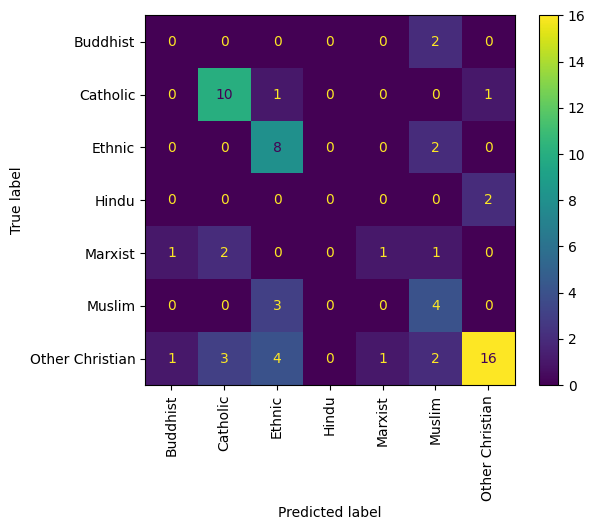

In [28]:
plt.figure()
#cmp = ConfusionMatrixDisplay(cm, display_labels=religion_encoder.classes_, xticks_rotation="vertical")
cmp = ConfusionMatrixDisplay.from_estimator(best_pipe, X_test, y_test, display_labels=religion_encoder.classes_[:-1], xticks_rotation="vertical")
#cmp.plot()

In [30]:
# selector_modes = list(cs_results["feature_selector__mode"].unique())
# score_functions = list(cs_results["feature_selector__score_func"].unique())
# cs_heatmaps = []


# for score_function in score_functions:
#     for selector_mode in selector_modes:
#         plt.figure()
#         cs_heatmaps.append(sns.heatmap(cs_results[(cs_results["feature_selector__mode"] == selector_mode) & (cs_results["feature_selector__score_func"] == score_function)].pivot(index="classifier__alpha", columns="feature_selector__param", values="score_mean"), vmin=0.0, vmax=0.55))
#         cs_heatmaps[-1].set_xlabel(f"Mode: {selector_mode} ({score_function})")
#         cs_heatmaps[-1].set_ylabel("Alpha")
#         cs_heatmaps[-1].set_title(f"Complement Naive Bayes {scoring_criterium} by Selector Parameter and Alpha")

In [31]:
features_scores = pd.DataFrame(list(zip(best_pipe[-2].scores_, best_pipe[-2].feature_names_in_)), columns=["Score", "Name"]).sort_values("Score", ascending=False)
included_features = best_pipe[-2].get_feature_names_out()
features_scores

,Score,Name
36,0.507436,zone_1
34,0.420573,landmass_5
32,0.291224,landmass_3
49,0.239887,language_Spanish
42,0.226238,language_English
...,...,...
2,0.000000,bars
48,0.000000,language_Slavic
41,0.000000,language_Chinese
46,0.000000,language_Other Indo-European


Text(0.5, 1.0, 'Feature Importance as determined by mutual_info_classif')

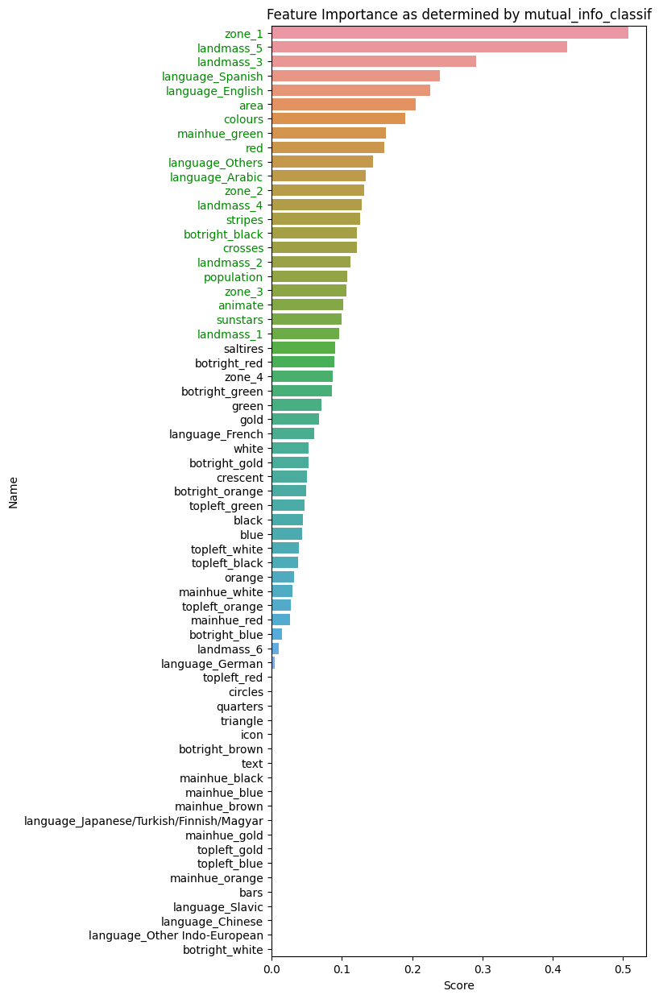

In [32]:
scoring_fig, scoring_ax = plt.subplots(figsize=(6, 15))
sns.barplot(features_scores, y="Name", x="Score", orient="horizontal", width=0.8, dodge=True, ax=scoring_ax)
for t in scoring_ax.yaxis.get_ticklabels():
    if t.get_text() in included_features:
        t.set_color("#008800")
scoring_ax.set_title(f"Feature Importance as determined by {best_pipe[-2].get_params()['score_func'].__name__}")

In [33]:
print(classification_report(y_true=y_test, y_pred=y_predicted, target_names=religion_encoder.classes_[:-1]))

                 precision    recall  f1-score   support

       Buddhist       0.00      0.00      0.00         2
       Catholic       0.67      0.83      0.74        12
         Ethnic       0.50      0.80      0.62        10
          Hindu       0.00      0.00      0.00         2
        Marxist       0.50      0.20      0.29         5
         Muslim       0.36      0.57      0.44         7
Other Christian       0.84      0.59      0.70        27

       accuracy                           0.60        65
      macro avg       0.41      0.43      0.40        65
   weighted avg       0.63      0.60      0.59        65



/home/vali/Documents/ml/ML_SS_23/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/vali/Documents/ml/ML_SS_23/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/vali/Documents/ml/ML_SS_23/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta